# Notebook extracts T and S from ASTE and predicts WM fractions

In [1]:
import xmitgcm.llcreader as llcreader # Needs xmitgcm installed
import xmitgcm 
import numpy as np
from numpy import pi
from netCDF4 import Dataset, num2date, date2num
import matplotlib.pyplot as plt
%matplotlib inline 
import cmocean # Nice colorbars
import warnings
import os
warnings.filterwarnings('ignore')
plt.rcParams.update({'font.size': 14, 'font.size': 14})
plt.rcParams['figure.figsize'] = (30, 15)
plt.rcParams['text.usetex'] = False

In [2]:
aste = llcreader.CRIOSPortalASTE270Model()
ds = aste.get_dataset()

Predict WM fractions for PW & AW at 20m, PW at 120m, and AW at 300m

**Extract data at 20m**

In [3]:
# Get model data for 15-25m depth for given face and month (0-11)

def retrieve_ASTE_data_for_water_mass_prediction_20m(ds, face, month):

    depth = 20
    
    # Select PT and S for the given face, month, and depth
    PT_avg = ds.THETA[month, 1:3, face, :, :].mean(dim='k').values
    S_avg = ds.SALT[month, 1:3, face, :, :].mean(dim='k').values

    # Longitude and latitude
    import gsw
    lat = ds.YG[face, :, :].values  
    lon = ds.XC[face, :, :].values

    # Pressure
    pressure = gsw.p_from_z(-depth, lat)

    # Convert practical salinity to absolute salinity
    SA_avg = gsw.SA_from_SP(S_avg, pressure, lon, lat)

    # Convert potential temperature to conservative temperature
    CT_avg = gsw.CT_from_pt(SA_avg, PT_avg)

    # Lon sine and cos
    lon_sin = np.sin(np.radians(lon))
    lon_cos = np.cos(np.radians(lon))

    # Season information
    radians = (2 * np.pi * month / 12) + 15
    seasonal_sin = np.sin(radians)
    season = ((month+1) % 12) // 3

    return SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth



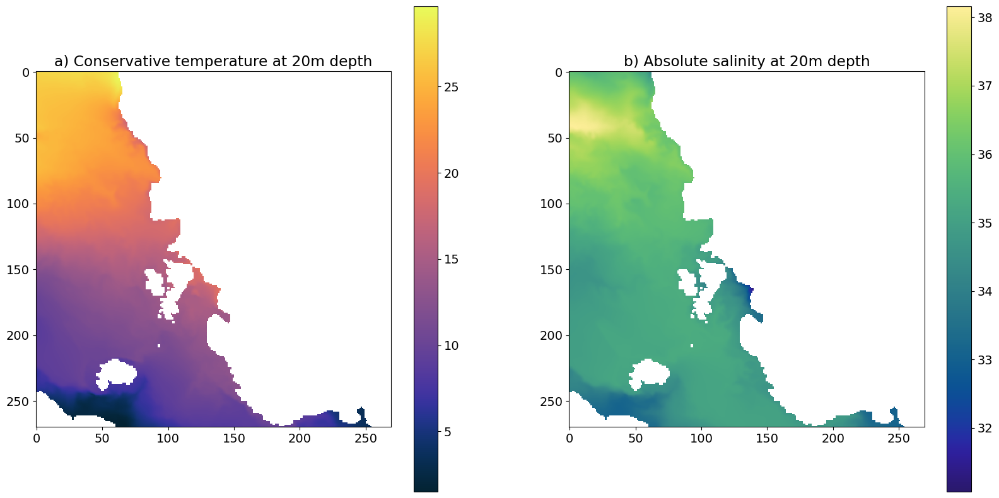

In [4]:
# Face 1, month 8 (September)

# Retrieve data
SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_20m(ds, 1, 8)

# Visualise data
fig, ax = plt.subplots(1,2, figsize=(20,10))
T_plot = ax[0].imshow(CT_avg, cmap=cmocean.cm.thermal)
fig.colorbar(T_plot, ax=ax[0])
ax[0].set_title('a) Conservative temperature at 20m depth')
S_plot = ax[1].imshow(SA_avg, cmap=cmocean.cm.haline)
fig.colorbar(S_plot, ax=ax[1])
ax[1].set_title('b) Absolute salinity at 20m depth')
plt.show()

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_1_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 20),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_1_data.dropna(subset=['conservative_temp'], inplace=True)


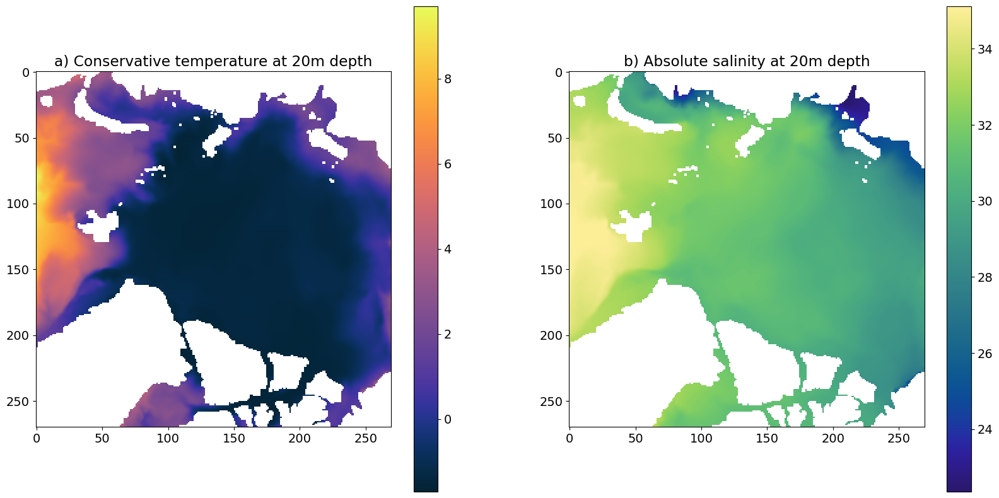

In [5]:
# Face 2 (central / Atlantic sector Arctic), month 8 (September)

# Retrieve data
SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_20m(ds, 2, 8)

# Visualise data
fig, ax = plt.subplots(1,2, figsize=(20,10))
T_plot = ax[0].imshow(CT_avg, cmap=cmocean.cm.thermal)
fig.colorbar(T_plot, ax=ax[0])
ax[0].set_title('a) Conservative temperature at 20m depth')
S_plot = ax[1].imshow(SA_avg, cmap=cmocean.cm.haline)
fig.colorbar(S_plot, ax=ax[1])
ax[1].set_title('b) Absolute salinity at 20m depth')
plt.show()

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_2_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 20),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_2_data.dropna(subset=['conservative_temp'], inplace=True)


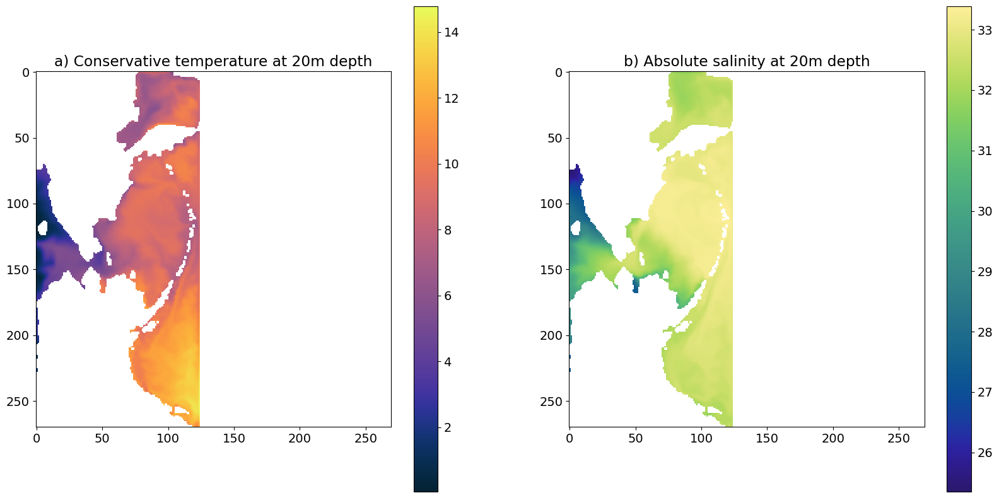

In [6]:
# Face 3 (central / Atlantic sector Arctic), month 8 (September)

# Retrieve data
SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_20m(ds, 3, 8)

# Visualise data
fig, ax = plt.subplots(1,2, figsize=(20,10))
T_plot = ax[0].imshow(CT_avg, cmap=cmocean.cm.thermal)
fig.colorbar(T_plot, ax=ax[0])
ax[0].set_title('a) Conservative temperature at 20m depth')
S_plot = ax[1].imshow(SA_avg, cmap=cmocean.cm.haline)
fig.colorbar(S_plot, ax=ax[1])
ax[1].set_title('b) Absolute salinity at 20m depth')
plt.show()

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_3_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 20),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_3_data.dropna(subset=['conservative_temp'], inplace=True)


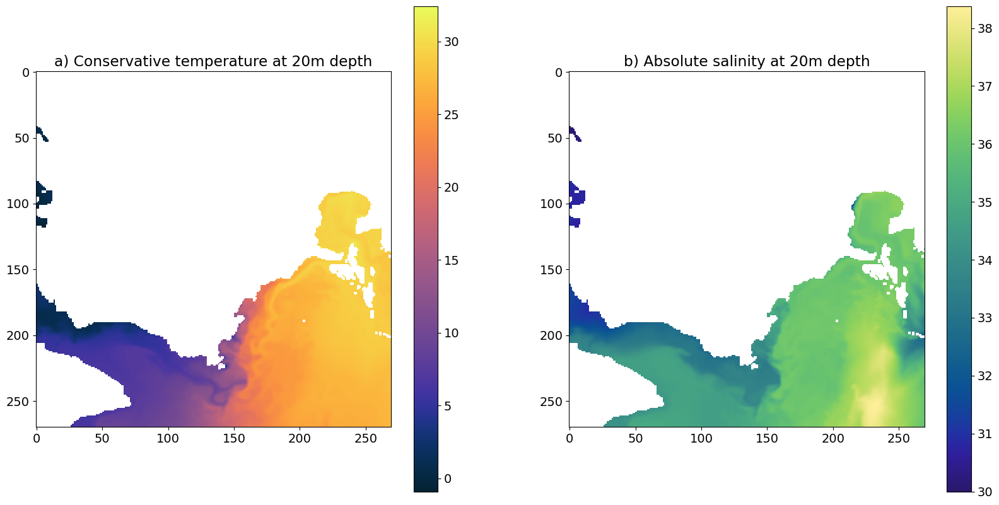

In [ ]:
# Face 4, month 8 (September)

# Retrieve data
SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_20m(ds, 4, 8)

# Visualise data
fig, ax = plt.subplots(1,2, figsize=(20,10))
T_plot = ax[0].imshow(CT_avg, cmap=cmocean.cm.thermal)
fig.colorbar(T_plot, ax=ax[0])
ax[0].set_title('a) Conservative temperature at 20m depth')
S_plot = ax[1].imshow(SA_avg, cmap=cmocean.cm.haline)
fig.colorbar(S_plot, ax=ax[1])
ax[1].set_title('b) Absolute salinity at 20m depth')
plt.show()

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_4_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 20),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_4_data.dropna(subset=['conservative_temp'], inplace=True)


In [8]:
# Combine Faces
All_faces_20m = pd.concat([Face_1_data, Face_2_data, Face_3_data, Face_4_data], ignore_index=True)

**Extract data at 120m**

In [9]:
# Get model data for 15-25m depth for given face and month (0-11)

def retrieve_ASTE_data_for_water_mass_prediction_120m(ds, face, month):

    depth = 120
    
    # Select PT and S for the given face, month, and depth
    PT_avg = ds.THETA[month, 11:13, face, :, :].mean(dim='k').values
    S_avg = ds.SALT[month, 11:13, face, :, :].mean(dim='k').values

    # Longitude and latitude
    import gsw
    lat = ds.YG[face, :, :].values  
    lon = ds.XC[face, :, :].values

    # Pressure
    pressure = gsw.p_from_z(-depth, lat)

    # Convert practical salinity to absolute salinity
    SA_avg = gsw.SA_from_SP(S_avg, pressure, lon, lat)

    # Convert potential temperature to conservative temperature
    CT_avg = gsw.CT_from_pt(SA_avg, PT_avg)

    # Lon sine and cos
    lon_sin = np.sin(np.radians(lon))
    lon_cos = np.cos(np.radians(lon))

    # Season information
    radians = (2 * np.pi * month / 12) + 15
    seasonal_sin = np.sin(radians)
    season = ((month+1) % 12) // 3

    return SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth



In [10]:
# Retrieve Face 1

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_120m(ds, 1, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_1_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 120),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_1_data.dropna(subset=['conservative_temp'], inplace=True)

# Retrieve Face 2

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_120m(ds, 2, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_2_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 120),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_2_data.dropna(subset=['conservative_temp'], inplace=True)

# Retrieve Face 3

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_120m(ds, 3, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_3_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 120),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_3_data.dropna(subset=['conservative_temp'], inplace=True)

# Retrieve Face 4

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_120m(ds, 4, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_4_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 120),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_4_data.dropna(subset=['conservative_temp'], inplace=True)

# Combine Faces
All_faces_120m = pd.concat([Face_1_data, Face_2_data, Face_3_data, Face_4_data], ignore_index=True)

**Extract data at 300m**

In [11]:
def retrieve_ASTE_data_for_water_mass_prediction_300m(ds, face, month):

    depth = 300
    
    # Select PT and S for the given face, month, and depth
    PT_avg = ds.THETA[month, 19, face, :, :].values
    S_avg = ds.SALT[month, 19, face, :, :].values

    # Longitude and latitude
    import gsw
    lat = ds.YG[face, :, :].values  
    lon = ds.XC[face, :, :].values

    # Pressure
    pressure = gsw.p_from_z(-depth, lat)

    # Convert practical salinity to absolute salinity
    SA_avg = gsw.SA_from_SP(S_avg, pressure, lon, lat)

    # Convert potential temperature to conservative temperature
    CT_avg = gsw.CT_from_pt(SA_avg, PT_avg)

    # Lon sine and cos
    lon_sin = np.sin(np.radians(lon))
    lon_cos = np.cos(np.radians(lon))

    # Season information
    radians = (2 * np.pi * month / 12) + 15
    seasonal_sin = np.sin(radians)
    season = ((month+1) % 12) // 3

    return SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth

In [153]:
# Retrieve Face 1

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_300m(ds, 1, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_1_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 300),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_1_data.dropna(subset=['conservative_temp'], inplace=True)

# Retrieve Face 2

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_300m(ds, 2, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_2_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 300),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_2_data.dropna(subset=['conservative_temp'], inplace=True)

# Retrieve Face 3

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_300m(ds, 3, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_3_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 300),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_3_data.dropna(subset=['conservative_temp'], inplace=True)

# Retrieve Face 4

SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth = retrieve_ASTE_data_for_water_mass_prediction_300m(ds, 4, 8)

# Convert model data to a pandas df that can be used for the water mass prediction
import pandas as pd
n_points = CT_avg.size  

# Create a DataFrame matching your training feature names:
Face_4_data = pd.DataFrame({
    'conservative_temp': CT_avg.flatten(),
    'absolute_salinity': SA_avg.flatten(),
    'lon_sin': lon_sin.flatten(),
    'lon_cos': lon_cos.flatten(),
    'latitude': lat.flatten(),      # use the lat grid from your model
    'depth': np.full(n_points, 300),   # constant depth value, here 20m
    'seasonal_sin': np.full(n_points, seasonal_sin),  # constant seasonal sine feature
    'season': np.full(n_points, season)               # constant season feature
})

# Optionally, drop any rows with missing data
Face_4_data.dropna(subset=['conservative_temp'], inplace=True)

# Combine Faces
All_faces_300m = pd.concat([Face_1_data, Face_2_data, Face_3_data, Face_4_data], ignore_index=True)

In [161]:
All_faces = pd.concat([All_faces_20m, All_faces_120m, All_faces_300m], ignore_index=True)

In [8]:
# Load water mass model

import joblib
import os
import pandas as pd
from netCDF4 import Dataset
import xarray as xr

# Folder where models are saved
output_directory = '/Users/ko389/Documents/GitHub/Arctic_water_masses/ML_model/'

# Load the models from the specified folder
models = []
for fold in range(1, 6):  # Replace 6 with the number of folds + 1
    model_filename = os.path.join(output_directory, f"models{fold}.joblib")
    model = joblib.load(model_filename)
    models.append(model)
    print(f"Model for fold {fold} loaded from: {model_filename}")

Model for fold 1 loaded from: /Users/ko389/Documents/GitHub/Arctic_water_masses/ML_model/models1.joblib
Model for fold 2 loaded from: /Users/ko389/Documents/GitHub/Arctic_water_masses/ML_model/models2.joblib
Model for fold 3 loaded from: /Users/ko389/Documents/GitHub/Arctic_water_masses/ML_model/models3.joblib
Model for fold 4 loaded from: /Users/ko389/Documents/GitHub/Arctic_water_masses/ML_model/models4.joblib
Model for fold 5 loaded from: /Users/ko389/Documents/GitHub/Arctic_water_masses/ML_model/models5.joblib


In [157]:
# Apply ML model

def ensemble_inference(models, X_new):
    predictions = []
    
    # Make predictions using each trained model on new data
    for model in models:
        pred = model.predict(X_new)
        predictions.append(pred)
    
    # Compute ensemble mean and variance
    mean_prediction = np.mean(predictions, axis=0)
    variance_prediction = np.var(predictions, axis=0)
    
    return mean_prediction, variance_prediction

mean_prediction, variance_prediction = ensemble_inference(models, All_faces)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_job

In [ ]:
# Combine water mass predictions and input data

mean_prediction = pd.DataFrame(mean_prediction, columns=["ASW", "sPW","sPWW", "wPW", "AW","AW", "BSW"])
mean_prediction = mean_prediction*100
All_faces.reset_index(drop=True, inplace=True)
mean_prediction = pd.concat([mean_prediction, All_faces], axis=1)
mean_prediction['longitude'] = np.degrees(np.arctan2(mean_prediction['lon_sin'], mean_prediction['lon_cos']))


In [163]:
# Remove Labrador Sea

labrador_Sea = mean_prediction[(mean_prediction['latitude']<80)&(mean_prediction['longitude']<-40)&(mean_prediction['longitude']>-120)].index
mean_prediction = mean_prediction.drop(labrador_Sea)

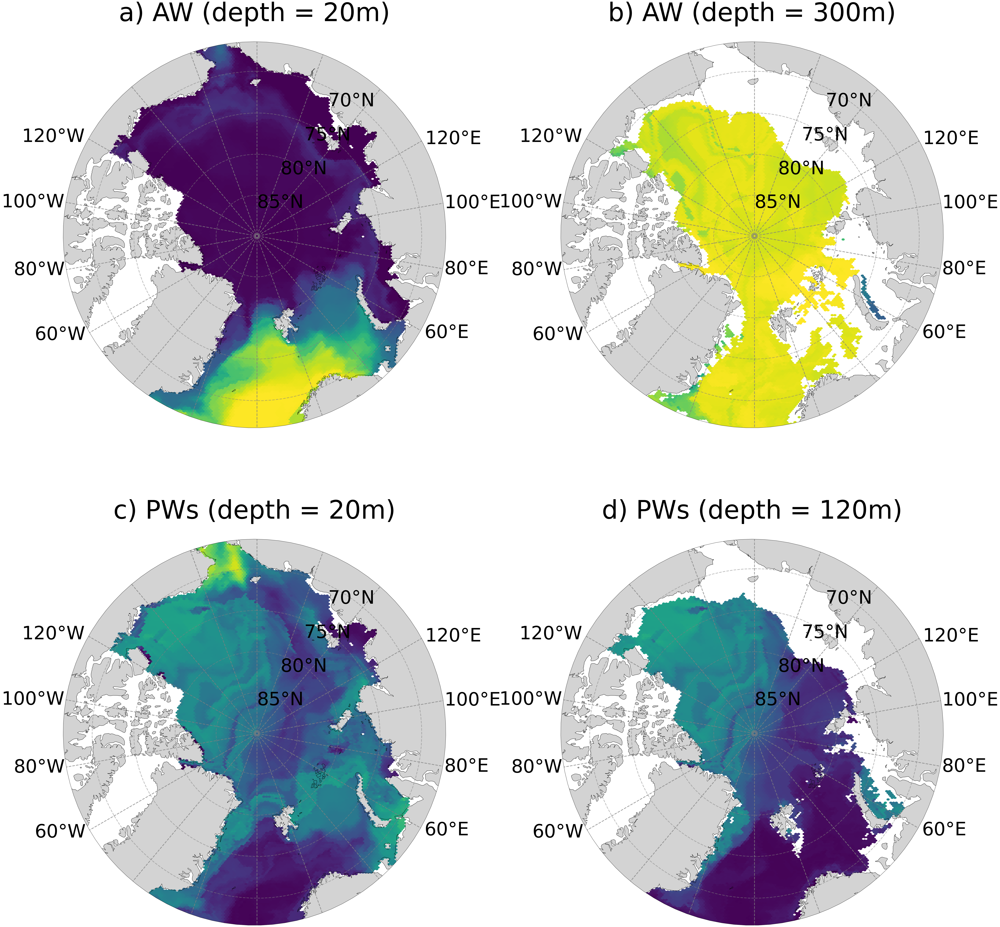

In [ ]:
# Horizontal distribution of all water masses

import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cmocean as cmo


fig, ax = plt.subplots(2, 2, figsize=(60,60), subplot_kw={'projection': ccrs.NorthPolarStereo()})

######### Atlantic Water at 20m #########

mean_prediction_20m = mean_prediction[mean_prediction['depth'] == 20]

ax[0,0].coastlines(resolution='50m', linewidth=1)
gl = ax[0,0].gridlines(draw_labels=True, linewidth=3, color='gray', alpha=0.5, linestyle='--')
ax[0,0].add_feature(cfeature.LAND, facecolor='lightgray')
ax[0,0].set_extent([-180, 180, 66.5, 90], ccrs.PlateCarree())
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0,0].set_boundary(circle, transform=ax[0,0].transAxes)

# Hexbin data
hb = ax[0,0].hexbin(
    mean_prediction_20m['longitude'],
    mean_prediction_20m['latitude'],
    C=mean_prediction_20m['AW']+mean_prediction_20m['AW'],  # Use the selected WM column
    reduce_C_function=np.max,  # Specify the reduction function to use the maximum value
    gridsize=(240, 313),  # Adjust the gridsize to such that bins are 1degree longitude and 0.05 degree latitude
    cmap='viridis',  # Choose the colormap you prefer
    transform=ccrs.PlateCarree(),
    vmin=0, vmax=100
)

# Adjust longitude and latitude labels
gl.xlocator = mticker.FixedLocator(np.concatenate([np.arange(-180, 180, 20), np.arange(-180, 180, 20)]))
gl.xformatter = LONGITUDE_FORMATTER
gl.xlabel_style = {'size': 80, 'color': 'k', 'rotation': 0}
gl.yformatter = LATITUDE_FORMATTER
gl.ylocator = mticker.FixedLocator(np.arange(65, 90, 5), 200)
gl.ylabel_style = {'size': 80, 'color': 'k', 'rotation': 0}

ax[0,0].set_title('a) AW (depth = 20m)', fontsize=110, y=1.05)

######### Atlantic Waters at 300m #########

mean_prediction_300m = mean_prediction[mean_prediction['depth'] == 300]

ax[0,1].coastlines(resolution='50m', linewidth=1)
gl = ax[0,1].gridlines(draw_labels=True, linewidth=3, color='gray', alpha=0.5, linestyle='--')
ax[0,1].add_feature(cfeature.LAND, facecolor='lightgray')
ax[0,1].set_extent([-180, 180, 66.5, 90], ccrs.PlateCarree())
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0,1].set_boundary(circle, transform=ax[0,1].transAxes)

# Hexbin data
hb = ax[0,1].hexbin(
    mean_prediction_300m['longitude'],
    mean_prediction_300m['latitude'],
    C=mean_prediction_300m['AW']+mean_prediction_300m['AW'],  # Use the selected WM column
    reduce_C_function=np.max,  # Specify the reduction function to use the maximum value
    gridsize=(240, 313),  # Adjust the gridsize to such that bins are 1degree longitude and 0.05 degree latitude
    cmap='viridis',  # Choose the colormap you prefer
    transform=ccrs.PlateCarree(),
    vmin=0, vmax=100
)

# Adjust longitude and latitude labels
gl.xlocator = mticker.FixedLocator(np.concatenate([np.arange(-180, 180, 20), np.arange(-180, 180, 20)]))
gl.xformatter = LONGITUDE_FORMATTER
gl.xlabel_style = {'size': 80, 'color': 'k', 'rotation': 0}
gl.yformatter = LATITUDE_FORMATTER
gl.ylocator = mticker.FixedLocator(np.arange(65, 90, 5), 200)
gl.ylabel_style = {'size': 80, 'color': 'k', 'rotation': 0}

ax[0,1].set_title('b) AW (depth = 300m)', fontsize=110, y=1.05)


######### Pacific Waters at 20m ########

ax[1,0].coastlines(resolution='50m', linewidth=1)
gl = ax[1,0].gridlines(draw_labels=True, linewidth=3, color='gray', alpha=0.5, linestyle='--')
ax[1,0].add_feature(cfeature.LAND, facecolor='lightgray')
ax[1,0].set_extent([-180, 180, 66.5, 90], ccrs.PlateCarree())
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1,0].set_boundary(circle, transform=ax[1,0].transAxes)

# Hexbin data
hb = ax[1,0].hexbin(
    mean_prediction['longitude'],
    mean_prediction['latitude'],
    C=mean_prediction['sPWW']+mean_prediction['sPW'] + mean_prediction['wPW'],  # Use the selected WM column
    reduce_C_function=np.max,  # Specify the reduction function to use the maximum value
    gridsize=(240, 313),  # Adjust the gridsize to such that bins are 1degree longitude and 0.05 degree latitude
    cmap='viridis',  # Choose the colormap you prefer
    transform=ccrs.PlateCarree(),
    vmin=0, vmax=100
)

# Adjust longitude and latitude labels
gl.xlocator = mticker.FixedLocator(np.concatenate([np.arange(-180, 180, 20), np.arange(-180, 180, 20)]))
gl.xformatter = LONGITUDE_FORMATTER
gl.xlabel_style = {'size': 80, 'color': 'k', 'rotation': 0}
gl.yformatter = LATITUDE_FORMATTER
gl.ylocator = mticker.FixedLocator(np.arange(65, 90, 5), 200)
gl.ylabel_style = {'size': 80, 'color': 'k', 'rotation': 0}

ax[1,0].set_title('c) PWs (depth = 20m)', fontsize=110, y=1.05)
#cbar.set_label('Water mass fraction (%)', fontsize=80)
#cbar = fig.colorbar(hb, ax=ax[1], orientation='vertical')
#cbar.ax.tick_params(labelsize=80)

######### Pacific Waters at 120m ########

mean_prediction_120m = mean_prediction[mean_prediction['depth'] == 120]

ax[1,1].coastlines(resolution='50m', linewidth=1)
gl = ax[1,1].gridlines(draw_labels=True, linewidth=3, color='gray', alpha=0.5, linestyle='--')
ax[1,1].add_feature(cfeature.LAND, facecolor='lightgray')
ax[1,1].set_extent([-180, 180, 66.5, 90], ccrs.PlateCarree())
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1,1].set_boundary(circle, transform=ax[1,1].transAxes)

# Hexbin data
hb = ax[1,1].hexbin(
    mean_prediction_120m['longitude'],
    mean_prediction_120m['latitude'],
    C=mean_prediction_120m['sPWW']+mean_prediction_120m['sPW'] + mean_prediction_120m['wPW'],  # Use the selected WM column
    reduce_C_function=np.max,  # Specify the reduction function to use the maximum value
    gridsize=(240, 313),  # Adjust the gridsize to such that bins are 1degree longitude and 0.05 degree latitude
    cmap='viridis',  # Choose the colormap you prefer
    transform=ccrs.PlateCarree(),
    vmin=0, vmax=100
)

# Adjust longitude and latitude labels
gl.xlocator = mticker.FixedLocator(np.concatenate([np.arange(-180, 180, 20), np.arange(-180, 180, 20)]))
gl.xformatter = LONGITUDE_FORMATTER
gl.xlabel_style = {'size': 80, 'color': 'k', 'rotation': 0}
gl.yformatter = LATITUDE_FORMATTER
gl.ylocator = mticker.FixedLocator(np.arange(65, 90, 5), 200)
gl.ylabel_style = {'size': 80, 'color': 'k', 'rotation': 0}

ax[1,1].set_title('d) PWs (depth = 120m)', fontsize=110, y=1.05)
#cbar = fig.colorbar(hb, ax=ax[1,1], orientation='vertical')
#cbar.set_label('Water mass fraction (%)', fontsize=80)
#cbar.ax.tick_params(labelsize=80)

# Overall title
#plt.suptitle('ASTE; August 2002-2018', fontsize=120)

plt.tight_layout()
plt.show()


Predict WM fractions for Beaufort Gyre and GINS & Barents Sea regions

**Extract data**

In [ ]:
# Get model data for 15-25m depth for given face and month (0-11)

def retrieve_ASTE_data_for_water_mass_prediction_120m(ds, face, month):

    depth = 120
    
    # Select PT and S for the given face, month, and depth
    PT_avg = ds.THETA[month, 11:13, face, :, :].mean(dim='k').values
    S_avg = ds.SALT[month, 11:13, face, :, :].mean(dim='k').values

    # Longitude and latitude
    import gsw
    lat = ds.YG[face, :, :].values  
    lon = ds.XC[face, :, :].values

    # Pressure
    pressure = gsw.p_from_z(-depth, lat)

    # Convert practical salinity to absolute salinity
    SA_avg = gsw.SA_from_SP(S_avg, pressure, lon, lat)

    # Convert potential temperature to conservative temperature
    CT_avg = gsw.CT_from_pt(SA_avg, PT_avg)

    # Lon sine and cos
    lon_sin = np.sin(np.radians(lon))
    lon_cos = np.cos(np.radians(lon))

    # Season information
    radians = (2 * np.pi * month / 12) + 15
    seasonal_sin = np.sin(radians)
    season = ((month+1) % 12) // 3

    return SA_avg, CT_avg, lon_sin, lon_cos, lat, seasonal_sin, season, depth


<xarray.DataArray 'THETA' (j: 270, i: 270)>
dask.array<mean_agg-aggregate, shape=(270, 270), dtype=float32, chunksize=(270, 270), chunktype=numpy.ndarray>
Coordinates:
    face     int64 2
  * i        (i) int64 0 1 2 3 4 5 6 7 8 ... 261 262 263 264 265 266 267 268 269
  * j        (j) int64 0 1 2 3 4 5 6 7 8 ... 261 262 263 264 265 266 267 268 269
    CS       (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>
    SN       (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>
    Depth    (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>
    rA       (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>
    XC       (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>
    YC       (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>
    maskInC  (j, i) float64 dask.array<chunksize=(270, 270), meta=np.ndarray>

In [15]:
ds.THETA

<xarray.DataArray 'THETA' (time: 193, k: 50, face: 6, j: 270, i: 270)>
dask.array<concatenate, shape=(193, 50, 6, 270, 270), dtype=float32, chunksize=(1, 1, 2, 270, 270), chunktype=numpy.ndarray>
Coordinates: (12/20)
  * face       (face) int64 0 1 2 3 4 5
  * i          (i) int64 0 1 2 3 4 5 6 7 8 ... 262 263 264 265 266 267 268 269
  * j          (j) int64 0 1 2 3 4 5 6 7 8 ... 262 263 264 265 266 267 268 269
  * k          (k) int64 0 1 2 3 4 5 6 7 8 9 ... 40 41 42 43 44 45 46 47 48 49
    niter      (time) int64 ...
  * time       (time) datetime64[ns] 2002-02-01 ... 2018-01-01T01:20:00
    ...         ...
    XC         (face, j, i) float64 dask.array<chunksize=(2, 270, 270), meta=np.ndarray>
    YC         (face, j, i) float64 dask.array<chunksize=(2, 270, 270), meta=np.ndarray>
    hFacC      (k, face, j, i) float64 dask.array<chunksize=(1, 2, 270, 270), meta=np.ndarray>
    maskC      (k, face, j, i) float64 dask.array<chunksize=(1, 2, 270, 270), meta=np.ndarray>
    maskCtrlC  (k, face, j, i) float64 dask.array<chunksize=(1, 2, 270, 270), meta=np.ndarray>
    maskInC    (face, j, i) float64 dask.array<chunksize=(2, 270, 270), meta=np.ndarray>
Attributes:
    standard_name:  THETA
    long_name:      Potential Temperature
    units:          degC

In [ ]:
# Get model input variables for monthyl 2002-2017, 0-200m depths, 2 face, and Beaufort Gyre region

# Averaging over time & depth
PT_avg = ds.THETA[:,0:17, 2, :, :]
#PT_monthly_avg = PT_avg.groupby('time.month').mean(dim='time')
#PT_monthly_avg = PT_monthly_avg.mean(dim='k')
#PT_Sep_avg = PT_monthly_avg[8, :, :]

S_avg = ds.SALT[:, 0:17, 2, :, :]
#S_monthly_avg = S_avg.groupby('time.month').mean(dim='time')
#S_monthly_avg = S_monthly_avg.mean(dim='k')
#S_Sep_avg = S_monthly_avg[8, :, :]

#Z_avg = ds.Z[8, 0:17, 2, :, :]
    
# Apply Beufort Gyre mask
mask = (PT_avg.XC > -170) & (PT_avg.XC < -130) & (PT_avg.YC < 81) & (PT_avg.YC > 70)
PT_avg_region = PT_avg.where(mask)
S_avg_region = S_avg.where(mask)

# Longitude and latitude of 2 face
import gsw
lat = ds.YG[2, :, :].values  
lon = ds.XC[2, :, :].values

"""# Pressure
pressure = gsw.p_from_z(-S_avg_region.Z.values, lat)

# Convert practical salinity to absolute salinity
SA_avg_region = gsw.SA_from_SP(S_avg_region, pressure, lon, lat)

# Convert potential temperature to conservative temperature
CT_avg_region = gsw.CT_from_pt(SA_avg_region, PT_avg_region)

# Lon sine and cos
lon_sin = np.sin(np.radians(lon))
lon_cos = np.cos(np.radians(lon))"""

# Season information
radians = (2 * np.pi * ds.time.dt.month.values / 12) + 15
seasonal_sin = np.sin(radians)
season = ((ds.time.dt.month.values+1) % 12) // 3

# Time information
year = ds.time.dt.year.values


In [37]:
import pandas as pd
import numpy as np
import gsw

dfs = []  # list to collect dataframes

# Loop over time steps
for k in range(len(ds.time)):
    # Pull current year
    current_year = year[k]
    current_seasonal_sin = seasonal_sin[k]
    current_season = season[k]
    
    for i in range(17):  # for depth levels 0 to 16
        n_points = PT_avg_region[k, i, :, :].size

        df = pd.DataFrame({
            'potential_temp': PT_avg_region[k, i, :, :].values.flatten(),
            'salinity': S_avg_region[k, i, :, :].values.flatten(),
            'lon': lon.flatten(),
            'latitude': lat.flatten(),
            'depth': np.full(n_points, -PT_avg_region.Z[i].values),  # depth from the model
            'year': np.full(n_points, current_year),
            'seasonal_sin': np.full(n_points, current_seasonal_sin),
            'season': np.full(n_points, current_season)
        })

        df.dropna(subset=['potential_temp'], inplace=True)
        dfs.append(df)

# Combine all time + depth DataFrames
Face_2_data_all_depths = pd.concat(dfs, ignore_index=True)

# Derived variables
Face_2_data_all_depths['pressure'] = gsw.p_from_z(-Face_2_data_all_depths['depth'], Face_2_data_all_depths['latitude'])
Face_2_data_all_depths['absolute_salinity'] = gsw.SA_from_SP(
    Face_2_data_all_depths['salinity'],
    Face_2_data_all_depths['pressure'],
    Face_2_data_all_depths['lon'],
    Face_2_data_all_depths['latitude']
)
Face_2_data_all_depths['conservative_temp'] = gsw.CT_from_pt(
    Face_2_data_all_depths['absolute_salinity'],
    Face_2_data_all_depths['potential_temp']
)
Face_2_data_all_depths['lon_sin'] = np.sin(np.radians(Face_2_data_all_depths['lon']))
Face_2_data_all_depths['lon_cos'] = np.cos(np.radians(Face_2_data_all_depths['lon']))


FSTimeoutError: 

In [ ]:
# Convert model data to a pandas df that can be used for the water mass predictio

import pandas as pd
import numpy as np

dfs = []  # list to collect dataframes

for k in range(193):
    for i in range(17):  #for depth levels 0 to 17
        n_points = PT_avg_region[k,i, :, :].size
        
        df = pd.DataFrame({
            'potential_temp': PT_avg_region[k,i, :, :].values.flatten(),
            'salinity': S_avg_region[k,i, :, :].values.flatten(),
            'lon': lon.flatten(),
            'latitude': lat.flatten(),
            'depth': np.full(n_points, -PT_avg_region.Z[i].values),  # depth from the model
            'seasonal_sin': np.full(n_points, seasonal_sin),
            'season': np.full(n_points, season)
        })

    df.dropna(subset=['potential_temp'], inplace=True)
    dfs.append(df)

# Combine all depth levels into a single DataFrame
Face_2_data_all_depths = pd.concat(dfs, ignore_index=True)


In [19]:
Face_2_data_all_depths

,potential_temp,salinity,lon,latitude,depth,seasonal_sin,season,pressure,absolute_salinity,conservative_temp,lon_sin,lon_cos
0,-1.487720,28.176634,-169.475112,81.043763,5.000,0.332765,3,5.053683,28.312715,-1.476693,-0.182663,-0.983176
1,-1.486968,28.157330,-169.525102,80.911559,5.000,0.332765,3,5.053664,28.293327,-1.475925,-0.181805,-0.983335
2,-1.486884,28.136120,-169.573719,80.779079,5.000,0.332765,3,5.053644,28.272025,-1.475830,-0.180970,-0.983489
3,-1.487924,28.112999,-169.621015,80.646319,5.000,0.332765,3,5.053625,28.248802,-1.476869,-0.180158,-0.983638
4,-1.490185,28.089260,-169.667041,80.513277,5.000,0.332765,3,5.053605,28.224958,-1.479140,-0.179368,-0.983782
...,...,...,...,...,...,...,...,...,...,...,...,...
92657,-1.102039,33.647419,-131.409562,71.453661,194.735,0.332765,3,196.837081,33.810815,-1.097069,-0.750001,-0.661437
92658,-1.060616,33.669502,-130.147725,71.745198,194.735,0.332765,3,196.840259,33.833212,-1.055673,-0.764385,-0.644761
92659,-1.050493,33.677879,-130.397929,71.654390,194.735,0.332765,3,196.839274,33.841593,-1.045563,-0.761562,-0.648092
92660,-1.074374,33.659302,-130.644033,71.563085,194.735,0.332765,3,196.838279,33.822887,-1.069414,-0.758771,-0.651358


In [5]:
#Get extra daata...

"""# Pressure
pressure = gsw.p_from_z(-S_avg_region.Z.values, lat)

# Convert practical salinity to absolute salinity
SA_avg_region = gsw.SA_from_SP(S_avg_region, pressure, lon, lat)

# Convert potential temperature to conservative temperature
CT_avg_region = gsw.CT_from_pt(SA_avg_region, PT_avg_region)

# Lon sine and cos
lon_sin = np.sin(np.radians(lon))
lon_cos = np.cos(np.radians(lon))"""

import gsw
Face_2_data_all_depths['pressure'] = gsw.p_from_z(-Face_2_data_all_depths['depth'], Face_2_data_all_depths['latitude'])
Face_2_data_all_depths['absolute_salinity'] = gsw.SA_from_SP(Face_2_data_all_depths['salinity'], Face_2_data_all_depths['pressure'], Face_2_data_all_depths['lon'], Face_2_data_all_depths['latitude'])
Face_2_data_all_depths['conservative_temp'] = gsw.CT_from_pt(Face_2_data_all_depths['absolute_salinity'], Face_2_data_all_depths['potential_temp'])
# Lon sine and cos
Face_2_data_all_depths['lon_sin'] = np.sin(np.radians(Face_2_data_all_depths['lon']))
Face_2_data_all_depths['lon_cos'] = np.cos(np.radians(Face_2_data_all_depths['lon']))

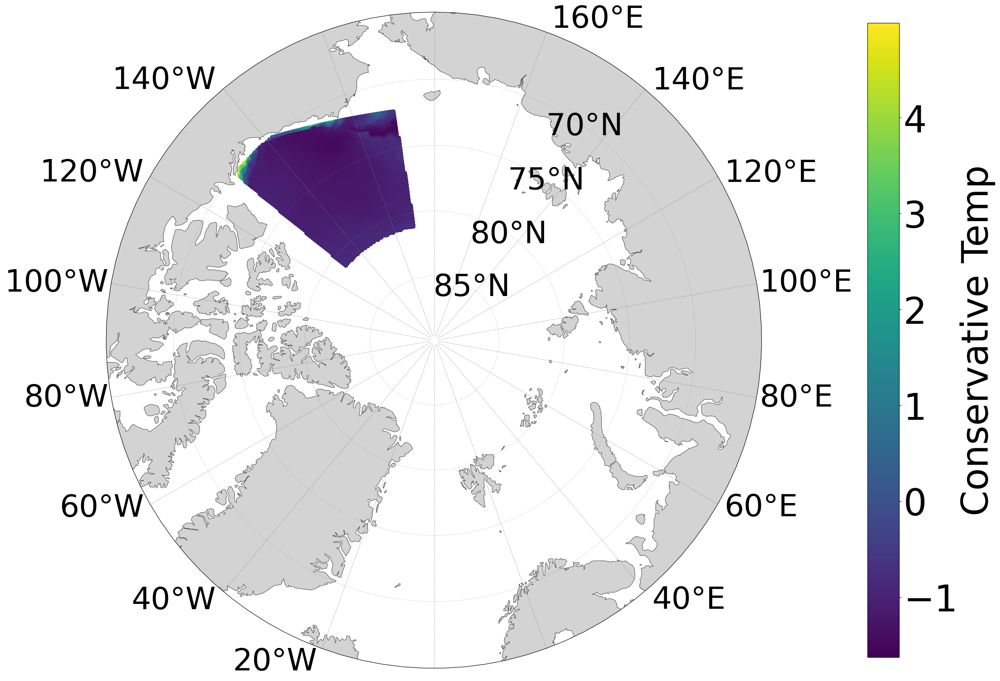

In [83]:
import pandas as pd
import numpy as np
import xarray as xr
import gsw
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.path as mpath
import seaborn as sn
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean.cm as cmo
import pandas as pd

def plot_spatial_dis_map(data):

    # Group by 'source' and 'nprof' to count unique profiles at each (latitude, longitude)
    """grouped_data = data.groupby(['source', 'nprof']).size().reset_index(name='profile_count')
    grouped_data_lon_lat = data.groupby(['source', 'nprof'])[['longitude', 'latitude']].max()
    grouped_data = pd.merge(grouped_data_lon_lat, grouped_data, on=['source', 'nprof'])"""

    # Create figure and specify the map projection
    fig = plt.figure(figsize=(24, 24))
    ax = plt.axes(projection=ccrs.NorthPolarStereo())

    # Customize the map by adding features
    ax.add_feature(cfeature.OCEAN,facecolor='white',zorder=1)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
    ax.coastlines(resolution='50m', linewidth=0.5, zorder=3)
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=4)
    
    # Set the extent of the map to focus on the Arctic region
    ax.set_extent([-180, 180, 65, 90], ccrs.PlateCarree())

    # Compute a circle boundary for the map
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Create the 2D histogram using hexbin
    hb = ax.scatter(
        data['lon'],
        data['latitude'], 
        c=data['conservative_temp'],
        #gridsize=(100), # Adjust the gridsize to your preference
        cmap='viridis', # Choose the colormap you prefer
        transform=ccrs.PlateCarree()
        #bins='log'
    )

    """# Color points with dissolved oxygen in red
    oxygen_points = data.dropna(subset=['oxygen'])
    sc = ax.scatter(
        oxygen_points['longitude'],
        oxygen_points['latitude'],
        c='black',
        s=8,
        # style
        marker='x',
        transform=ccrs.PlateCarree(),
        zorder=5
    )"""

    # Add colorbar
    cbar = plt.colorbar(hb, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('Conservative Temp', fontsize=60)
    cbar.ax.tick_params(labelsize=60)

    # Make colorbar height same as plot
    ax_size = ax.get_position()
    cbar.ax.set_position([ax_size.x1 + 0.1, ax_size.y0, 0.03, ax_size.height])

    """# Add legend
    legend = fig.legend(
        [sc], 
        ['DO profiles'], 
        loc='upper right', 
        fontsize=50, 
        bbox_to_anchor=(0.94, 0.827),  # Adjust x and y to position it over the colorbar
        markerscale=5, 
        framealpha=1,  # Keep the frame opaque
        edgecolor='black',
        handletextpad=0.02
    )
    legend.set_zorder(10)  # Ensure it is above the colorbar"""

    # Adjust longitude and latitude labels
    gl.xlocator = mticker.FixedLocator(np.concatenate([np.arange(-180,180,20),np.arange(-180,180,20)]))
    gl.xformatter = LONGITUDE_FORMATTER
    gl.xlabel_style = {'size': 50, 'color': 'k','rotation':0}
    gl.yformatter = LATITUDE_FORMATTER
    gl.ylocator = mticker.FixedLocator(np.arange(65,90,5),200)
    gl.ylabel_style = {'size': 50, 'color': 'k','rotation':0}

    #plt.title('c) Spatial distribution', fontsize=80, y=1.05)

    plt.show()

plot_spatial_dis_map(Face_2_data_all_depths)

In [6]:
df = Face_2_data_all_depths.drop(columns=['lon', 'potential_temp', 'salinity', 'pressure'])
df


,latitude,depth,seasonal_sin,season,absolute_salinity,conservative_temp,lon_sin,lon_cos
0,81.043763,5.000,0.332765,3,28.312715,-1.476693,-0.182663,-0.983176
1,80.911559,5.000,0.332765,3,28.293327,-1.475925,-0.181805,-0.983335
2,80.779079,5.000,0.332765,3,28.272025,-1.475830,-0.180970,-0.983489
3,80.646319,5.000,0.332765,3,28.248802,-1.476869,-0.180158,-0.983638
4,80.513277,5.000,0.332765,3,28.224958,-1.479140,-0.179368,-0.983782
...,...,...,...,...,...,...,...,...
92657,71.453661,194.735,0.332765,3,33.810815,-1.097069,-0.750001,-0.661437
92658,71.745198,194.735,0.332765,3,33.833212,-1.055673,-0.764385,-0.644761
92659,71.654390,194.735,0.332765,3,33.841593,-1.045563,-0.761562,-0.648092
92660,71.563085,194.735,0.332765,3,33.822887,-1.069414,-0.758771,-0.651358


In [9]:
# Apply ML model

def ensemble_inference(models, X_new):
    predictions = []
    
    # Make predictions using each trained model on new data
    for model in models:
        pred = model.predict(X_new)
        predictions.append(pred)
    
    # Compute ensemble mean and variance
    mean_prediction = np.mean(predictions, axis=0)
    variance_prediction = np.var(predictions, axis=0)
    
    return mean_prediction, variance_prediction

mean_prediction, variance_prediction = ensemble_inference(models, df)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

In [ ]:
mean_prediction = pd.DataFrame(mean_prediction, columns=["ASW", "MsPW","sPW", "wPW", "NCW","AW", "BW"])
mean_prediction = pd.concat([mean_prediction, df], axis=1)
mean_prediction ['longitude'] = np.degrees(np.arctan2(mean_prediction['lon_sin'], mean_prediction['lon_cos']))

In [14]:
mean_prediction

,ASW,MsPW,ACCW,wPW,NCW,MAW,BW,latitude,depth,seasonal_sin,season,absolute_salinity,conservative_temp,lon_sin,lon_cos,longitude
0,0.971049,0.0,0.028951,0.0,0.000000,0.0,0.0,81.043763,5.000,0.332765,3,28.312715,-1.476693,-0.182663,-0.983176,-169.475112
1,0.971049,0.0,0.028951,0.0,0.000000,0.0,0.0,80.911559,5.000,0.332765,3,28.293327,-1.475925,-0.181805,-0.983335,-169.525102
2,0.971049,0.0,0.028951,0.0,0.000000,0.0,0.0,80.779079,5.000,0.332765,3,28.272025,-1.475830,-0.180970,-0.983489,-169.573719
3,0.971049,0.0,0.028951,0.0,0.000000,0.0,0.0,80.646319,5.000,0.332765,3,28.248802,-1.476869,-0.180158,-0.983638,-169.621015
4,0.971049,0.0,0.028951,0.0,0.000000,0.0,0.0,80.513277,5.000,0.332765,3,28.224958,-1.479140,-0.179368,-0.983782,-169.667041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92657,0.000000,0.0,0.003805,0.0,0.996195,0.0,0.0,71.453661,194.735,0.332765,3,33.810815,-1.097069,-0.750001,-0.661437,-131.409562
92658,0.000000,0.0,0.003805,0.0,0.996195,0.0,0.0,71.745198,194.735,0.332765,3,33.833212,-1.055673,-0.764385,-0.644761,-130.147725
92659,0.000000,0.0,0.003805,0.0,0.996195,0.0,0.0,71.654390,194.735,0.332765,3,33.841593,-1.045563,-0.761562,-0.648092,-130.397929
92660,0.000000,0.0,0.003805,0.0,0.996195,0.0,0.0,71.563085,194.735,0.332765,3,33.822887,-1.069414,-0.758771,-0.651358,-130.644033
